Performance Analysis of Supervised Machine Learning Algorithms for Breast Cancer Classification

Objective

In [36]:
# ▪ Exploratory Data Analysis

# ▪ Feature Selection

# ▪ Building Supervised Machine Learning Classifiers
#    ▪ Logistic Regression
#    ▪ Random Forest
#    ▪ Decision Tree
#    ▪ K-nearest Neighbors (KNN)
#    ▪ Support Vector Machine (SVM)
#    ▪ Naive Bayes (NB)
#    ▪ XGBoost
#    ▪ Artificial Neural Network (ANN)

# ▪ Making Predictions with Classifiers

# ▪ Performance Analysis of the Classifiers 

# ▪ Classifiers Comparison

Data sources

In [37]:
# The Breast Cancer dataset is available in machine learning repositories maintained by the University of California, Irvine
# https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

In [38]:
# The dataset contains 569 samples of malignant and benign tumor cells
# 1 = Malignant (Cancerous) 212
# 0 = Benign (Not Cancerous) 357
# Missing values: none

In [39]:
# The first two columns in the dataset store "the unique ID of the samples" and "the corresponding diagnosis (M=malignant, B=benign)", respectively.

# Columns 3-32 contain 30 real-value features that have been computed from digitized images of the cell nuclei:
# ▪ radius (mean of distances from center to points on the perimeter)
# ▪ texture (standard deviation of gray-scale values)
# ▪ perimeter
# ▪ area
# ▪ smoothness (local variation in radius lengths)
# ▪ compactness (perimeter^2 / area - 1.0)
# ▪ concavity (severity of concave portions of the contour)
# ▪ concave points (number of concave portions of the contour)
# ▪ symmetry
# ▪ fractal dimension (“coastline approximation” - 1)

In [96]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from xgboost import XGBClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler,PowerTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score, auc,roc_curve,classification_report,accuracy_score
from sklearn import metrics

from keras.models import Sequential
from keras.layers import Dense, Dropout

In [41]:
# load dataset => 31 features , 569 samples
# Diagnosis (target variable = labels) => M = malignant, B = benign

df = pd.read_csv('./data/data.csv')
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [42]:
# summary of the data => the type of data in each column + the number of non-null values in each column + the memory usage of dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [43]:
# features
print('Number of features : ',len(df.columns))
df.columns

Number of features :  33


Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

Data Cleaning

In [44]:
# check for missing values
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [45]:
# remove useless features => 'Unnamed: 32'(contains NAN values) & 'id'
df = df.dropna(axis=1)
df = df.drop(['id'],axis = 1)

In [46]:
print('Number of features : ',len(df.columns) , " | 'diagnosis' is the target variable (label)")
df.columns

Number of features :  31  | 'diagnosis' is the target variable (label)


Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

<Axes: >

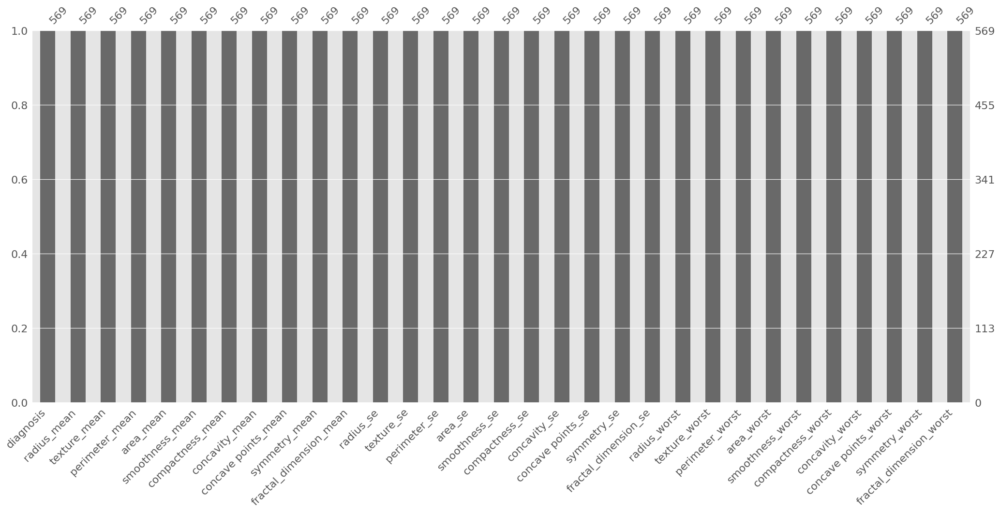

In [12]:
# visualizing null values => Now there is no NULL and missing values
msno.bar(df)

Exploratory Data Analysis

In [47]:
# count of diagnosis variable
B, M = df['diagnosis'].value_counts()
print('Number of Benign (abscence of cancer cells): ', B)
print('Number of Malignant (prescence of cancer cells): ', M)

trace = go.Bar(x=(M, B), y=['malignant', 'benign'], orientation='h', marker=dict(color=['#ffcccc', '#99bbff'], line=dict(color='#000000', width=1.5)))
layout = dict(title='Count of diagnosis variable')

fig = dict(data=[trace], layout=layout)
py.iplot(fig)

# distribution of diagnosis variable
trace = go.Pie(labels=['benign', 'malignant'], values=df['diagnosis'].value_counts(), textfont=dict(size=15), marker=dict(colors=['#99bbff', '#ffcccc'], line=dict(color='#000000', width=1.5)))
layout = dict(title='Distribution of diagnosis variable')

fig = dict(data=[trace], layout=layout)
py.iplot(fig)

Number of Benign (abscence of cancer cells):  357
Number of Malignant (prescence of cancer cells):  212


In [48]:
# descriptive statistics
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [49]:
df.skew(numeric_only=True)

radius_mean                0.942380
texture_mean               0.650450
perimeter_mean             0.990650
area_mean                  1.645732
smoothness_mean            0.456324
compactness_mean           1.190123
concavity_mean             1.401180
concave points_mean        1.171180
symmetry_mean              0.725609
fractal_dimension_mean     1.304489
radius_se                  3.088612
texture_se                 1.646444
perimeter_se               3.443615
area_se                    5.447186
smoothness_se              2.314450
compactness_se             1.902221
concavity_se               5.110463
concave points_se          1.444678
symmetry_se                2.195133
fractal_dimension_se       3.923969
radius_worst               1.103115
texture_worst              0.498321
perimeter_worst            1.128164
area_worst                 1.859373
smoothness_worst           0.415426
compactness_worst          1.473555
concavity_worst            1.150237
concave points_worst       0

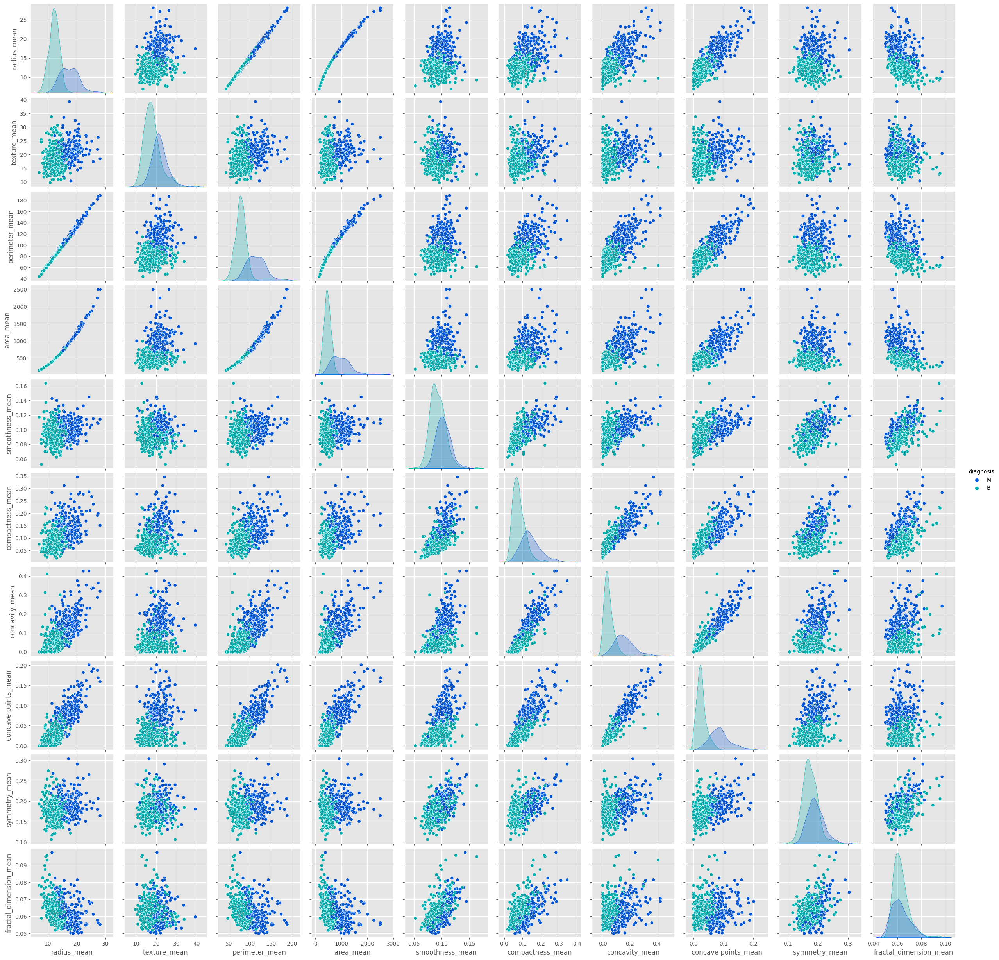

In [18]:
# scatter plot matrix with "mean" features
cols = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean',
        'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

sns.pairplot(data=df[cols], hue='diagnosis', palette='winter')

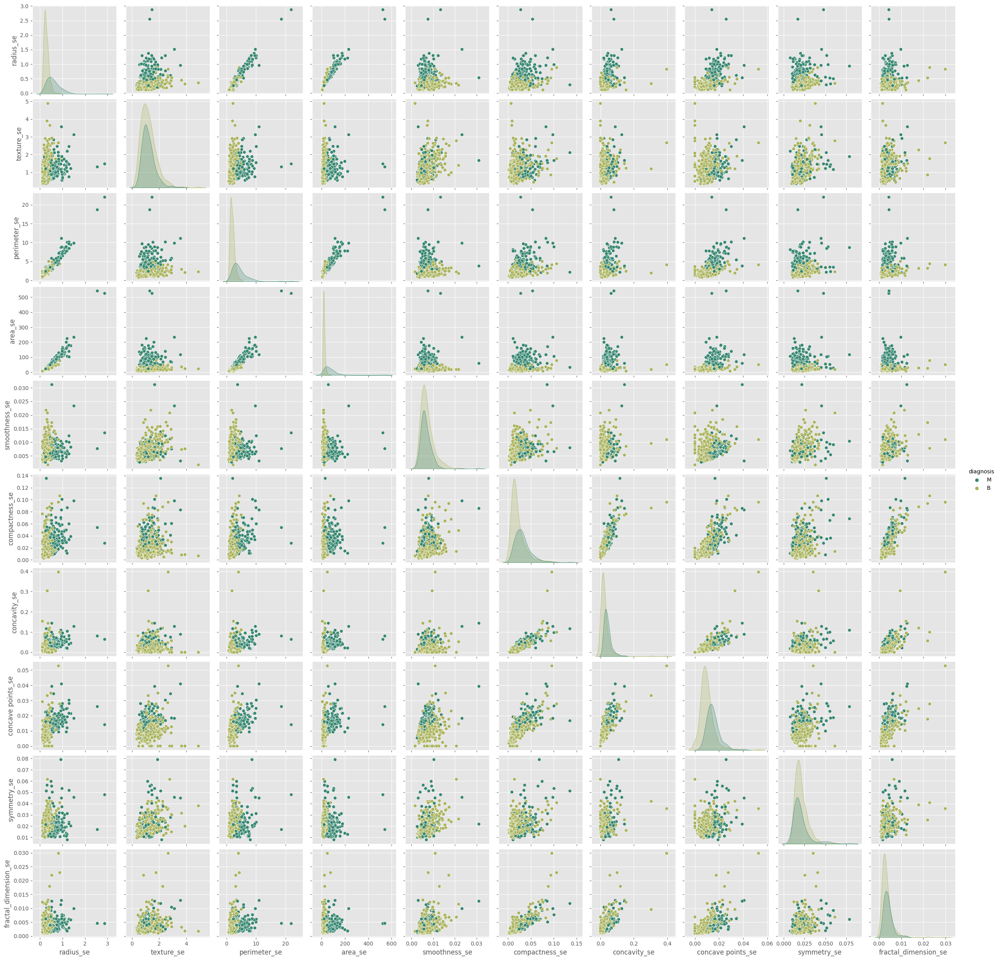

In [19]:
# scatter plot matrix with "SE" features
s_col = ['diagnosis', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
         'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
         'fractal_dimension_se']

sns.pairplot(data=df[s_col], hue='diagnosis', palette='gist_earth')

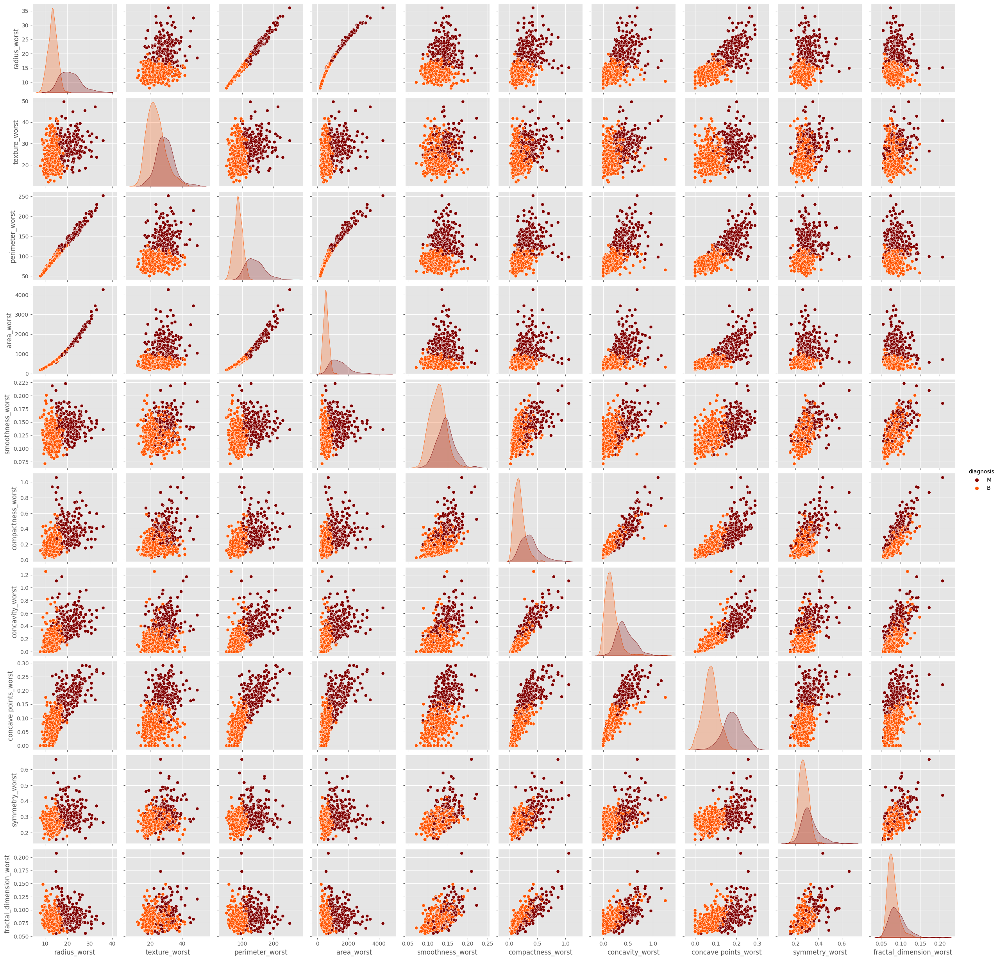

In [20]:
# scatter plot matrix with "worst" features
w_col = ['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

sns.pairplot(data=df[w_col], hue='diagnosis', palette='gist_heat')

In [50]:
# Reassign diagnosis => convert from categorical to numerical
print(df.diagnosis.unique())
df.diagnosis.replace(to_replace = dict(M = 1, B = 0), inplace = True)
df.head()

['M' 'B']


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Feature Selection : Removing redundant & irrelevant features 

<Axes: >

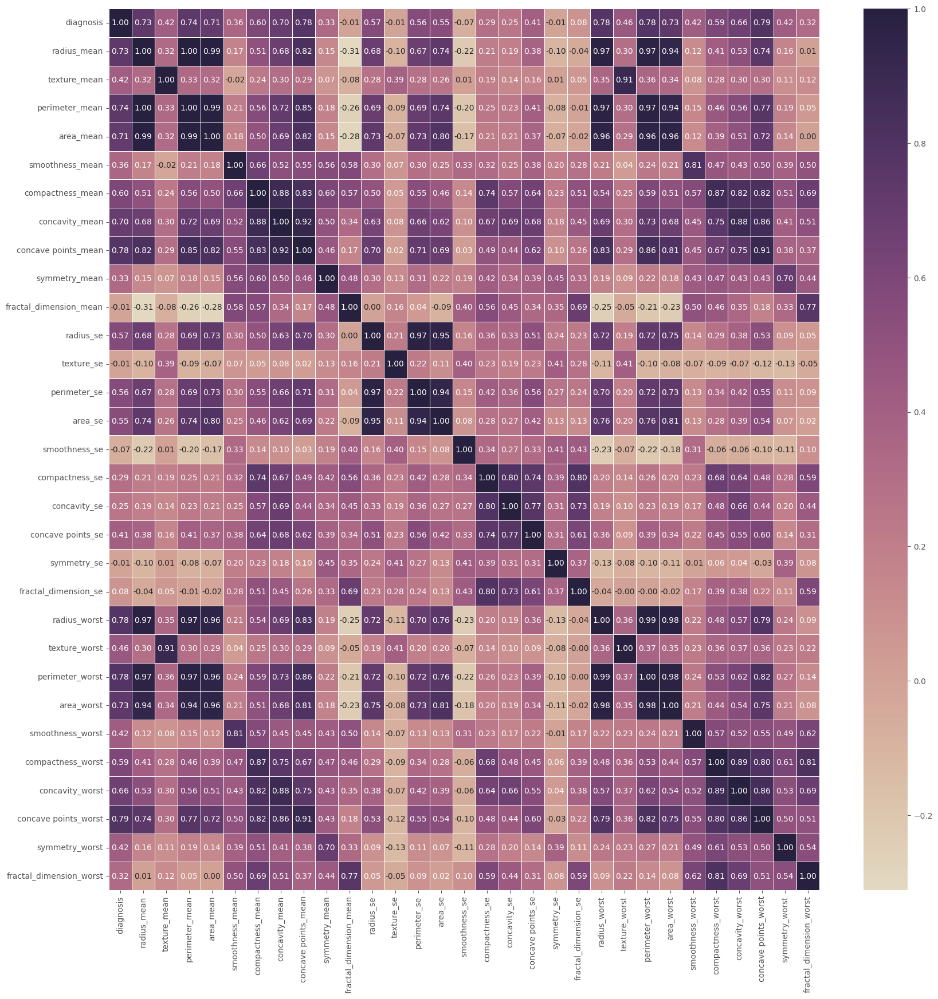

In [51]:
# correlation coefficients matrix
# two variables are highly correlated, if one of them gives information about the other. So, if two features are correlated, the model only needs one, as the second does not add additional information.
# there are some columns which are highly correlated which causes multicollinearity so we have to remove highly correlated features

f,ax = plt.subplots(figsize=(20, 20))
sns.heatmap(df.corr(), cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True), annot=True, linewidths=.5, fmt= '.2f',ax=ax)

In [23]:
# 1- the radius_mean column has a correlation of 1 and 0.99 with perimeter_mean and area_mean columns, respectively => we should only pick one of the three columns

# 2- each of the 10 key attributes displays very high (0.7-0.97) correlations between its "mean" and "worst" columns => the radius_mean column has a correlation of 0.97 with the radius_worst column

# 3- concavity & concave points & compactness_worst are also highly-correlated

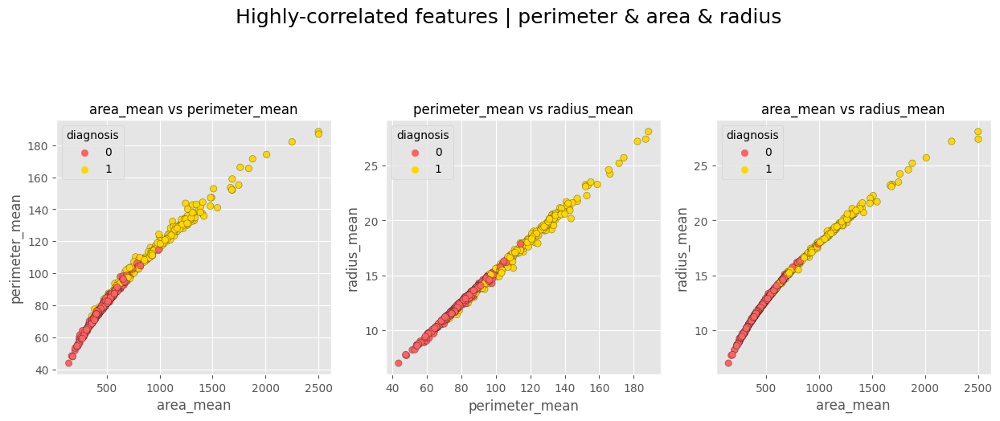

In [52]:
# Highly-correlated features => perimeter & area & radius
palette ={0 : '#FC6262', 1 : 'gold'}
edgecolor = '#0006'

fig = plt.figure(figsize=(15,14))

plt.subplot(331)
ax2 = sns.scatterplot(x = df['area_mean'], y = df['perimeter_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('area_mean vs perimeter_mean',fontsize = 12)

plt.subplot(332)
ax3 = sns.scatterplot(x = df['perimeter_mean'], y = df['radius_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('perimeter_mean vs radius_mean',fontsize = 12)

plt.subplot(333)
ax4 = sns.scatterplot(x = df['area_mean'], y = df['radius_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('area_mean vs radius_mean',fontsize = 12)

fig.suptitle('Highly-correlated features | perimeter & area & radius', fontsize = 18)
plt.show()

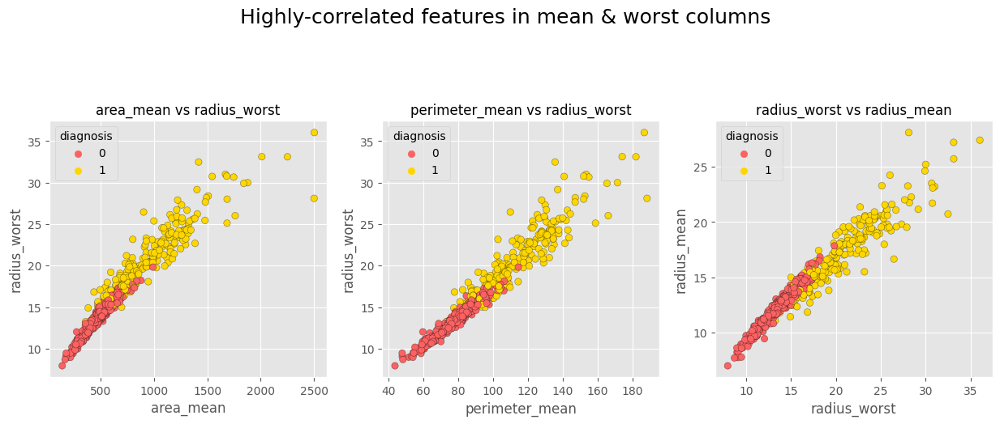

In [53]:
# Highly-correlated features => mean & worst columns
palette ={0 : '#FC6262', 1 : 'gold'}

fig = plt.figure(figsize=(15,14))

plt.subplot(331)
ax2 = sns.scatterplot(x = df['area_mean'], y = df['radius_worst'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('area_mean vs radius_worst',fontsize = 12)

plt.subplot(332)
ax3 = sns.scatterplot(x = df['perimeter_mean'], y = df['radius_worst'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('perimeter_mean vs radius_worst',fontsize = 12)

plt.subplot(333)
ax4 = sns.scatterplot(x = df['radius_worst'], y = df['radius_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('radius_worst vs radius_mean',fontsize = 12)

fig.suptitle('Highly-correlated features in mean & worst columns', fontsize = 18)
plt.show()

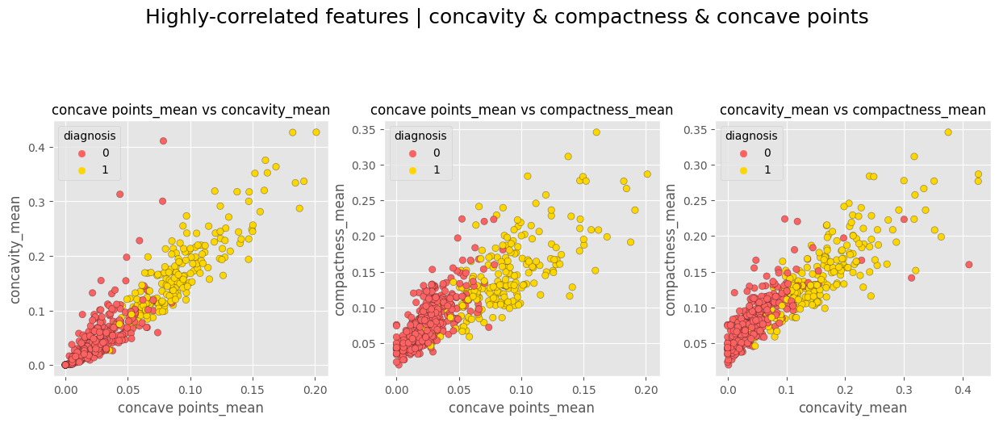

In [54]:
# Highly-correlated features => concavity & compactness & concave points
palette ={0 : '#FC6262', 1 : 'gold'}

fig = plt.figure(figsize=(15,14))

plt.subplot(331)
ax2 = sns.scatterplot(x = df['concave points_mean'], y = df['concavity_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('concave points_mean vs concavity_mean',fontsize = 12)

plt.subplot(332)
ax3 = sns.scatterplot(x = df['concave points_mean'], y = df['compactness_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('concave points_mean vs compactness_mean',fontsize = 12)

plt.subplot(333)
ax4 = sns.scatterplot(x = df['concavity_mean'], y = df['compactness_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('concavity_mean vs compactness_mean',fontsize = 12)

fig.suptitle('Highly-correlated features | concavity & compactness & concave points', fontsize = 18)
plt.show()

In [55]:
# select highly correlated features

def correlation(dataset, threshold):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i] 
                col_corr.add(colname)
    return col_corr

corr_features = correlation(df, 0.8)
print(len(set(corr_features)))
corr_features

17


{'area_mean',
 'area_se',
 'area_worst',
 'compactness_worst',
 'concave points_mean',
 'concave points_worst',
 'concavity_mean',
 'concavity_se',
 'concavity_worst',
 'fractal_dimension_se',
 'fractal_dimension_worst',
 'perimeter_mean',
 'perimeter_se',
 'perimeter_worst',
 'radius_worst',
 'smoothness_worst',
 'texture_worst'}

In [56]:
# # drop all "worst" columns
# cols = ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst','concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

# # drop "perimeter" & "area" columns
# cols = ['perimeter_mean','perimeter_se', 'area_mean', 'area_se']

# # drop "concavity" & "concave points" columns
# cols = ['concavity_mean','concavity_se', 'concave points_mean', 'concave points_se']

df = df.drop(corr_features, axis = 1)
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'smoothness_mean',
       'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'smoothness_se', 'compactness_se',
       'concave points_se', 'symmetry_se', 'symmetry_worst'],
      dtype='object')

<Axes: >

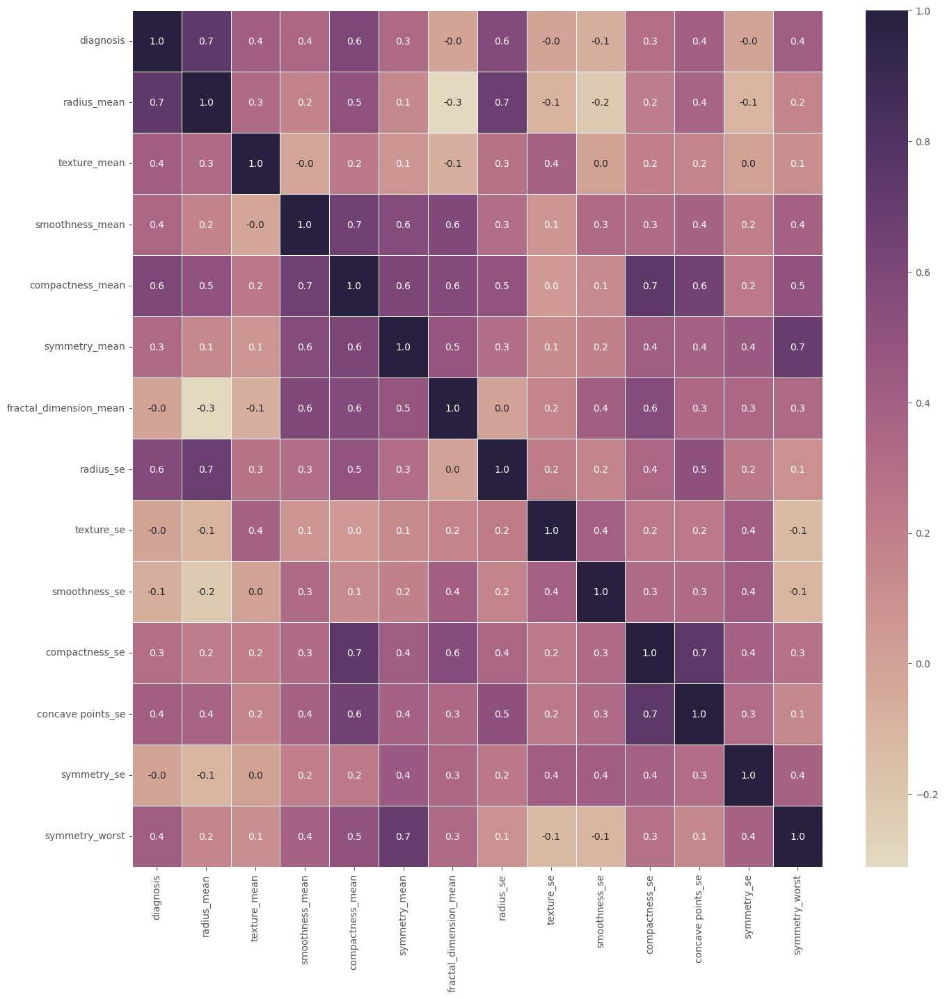

In [57]:
# draw the heatmap again
fig,ax=plt.subplots(figsize=(16,16))
sns.heatmap(df.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax, cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True))

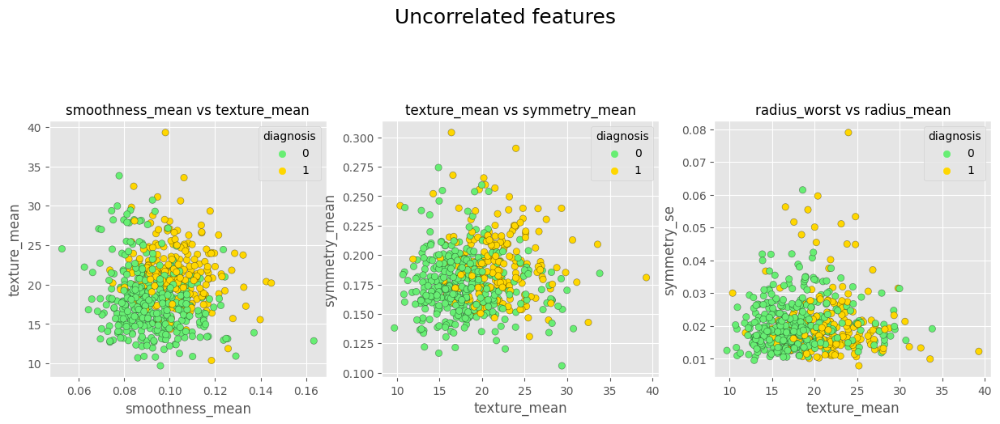

In [58]:
# Uncorrelated features
palette ={0 : '#67EE73', 1 : 'gold'}

fig = plt.figure(figsize=(15,14))

plt.subplot(331)
ax2 = sns.scatterplot(x = df['smoothness_mean'], y = df['texture_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('smoothness_mean vs texture_mean',fontsize = 12)

plt.subplot(332)
ax3 = sns.scatterplot(x = df['texture_mean'], y = df['symmetry_mean'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('texture_mean vs symmetry_mean',fontsize = 12)

plt.subplot(333)
ax4 = sns.scatterplot(x = df['texture_mean'], y = df['symmetry_se'], hue = "diagnosis",data = df, palette =palette, edgecolor=edgecolor)
plt.title('radius_worst vs radius_mean',fontsize = 12)

fig.suptitle('Uncorrelated features', fontsize = 18)
plt.show()

Data Preprocessing

In [59]:
# x => features , y => labels                         
X = df.drop(['diagnosis'],axis = 1 )
y = df['diagnosis']
X.head()

,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concave points_se,symmetry_se,symmetry_worst
0,17.99,10.38,0.11840,0.27760,0.2419,0.07871,1.0950,0.9053,0.006399,0.04904,0.01587,0.03003,0.4601
1,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01340,0.01389,0.2750
2,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.02058,0.02250,0.3613
3,11.42,20.38,0.14250,0.28390,0.2597,0.09744,0.4956,1.1560,0.009110,0.07458,0.01867,0.05963,0.6638
4,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.01885,0.01756,0.2364


In [60]:
#split the  data into traing and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42) 

# feature scaling => Normalize the  data (rescale to a value between 0 to 1 in order to remove the variance)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [61]:
print("Shape of training set:", X_train.shape)
print("Shape of test set:", X_test.shape)

Shape of training set: (455, 13)
Shape of test set: (114, 13)


Classification Models

1. Logistic Regression

In [62]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
LG_y_pred = log_reg.predict(X_test)

In [63]:
log_reg_acc = accuracy_score(y_test, LG_y_pred)
print("Logistic Regression Accuracy: ",log_reg_acc)

Logistic Regression Accuracy:  0.956140350877193


In [64]:
# Logistic Regression Metrics
LG_precision_score = precision_score(y_test, LG_y_pred)
LG_recall_score = recall_score(y_test, LG_y_pred)
fp1, tp1, t1 = roc_curve(y_test, LG_y_pred)
LG_auc = auc(fp1, tp1)

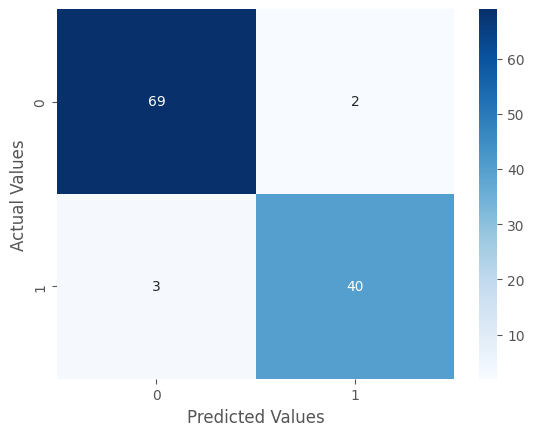

              precision    recall  f1-score   support

           0       0.96      0.97      0.97        71
           1       0.95      0.93      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



In [66]:
LG_cm = metrics.confusion_matrix(y_test, LG_y_pred)
sns.heatmap(LG_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, LG_y_pred ))

2. Random Forest

In [67]:
RF = RandomForestClassifier(criterion = 'entropy', max_depth = 11, min_samples_leaf = 2, min_samples_split = 3, n_estimators = 130)
RF.fit(X_train, y_train)
RF_y_pred = RF.predict(X_test)

In [68]:
RF_acc = accuracy_score(y_test, RF_y_pred)
print("Random Forest Accuracy: ",RF_acc)

Random Forest Accuracy:  0.9298245614035088


In [69]:
# Random Forest Metrics
RF_precision_score = precision_score(y_test, RF_y_pred)
RF_recall_score = recall_score(y_test, RF_y_pred)
fp2, tp2, t2 = roc_curve(y_test, RF_y_pred)
RF_auc = auc(fp2, tp2)

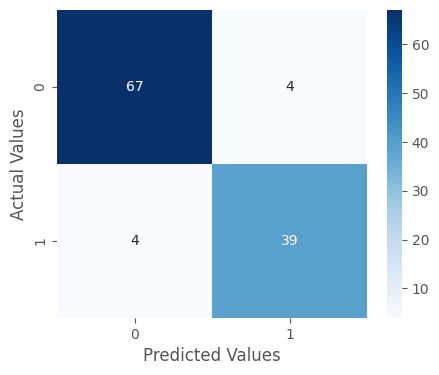

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        71
           1       0.91      0.91      0.91        43

    accuracy                           0.93       114
   macro avg       0.93      0.93      0.93       114
weighted avg       0.93      0.93      0.93       114



In [70]:
RF_cm = metrics.confusion_matrix(y_test, RF_y_pred)
sns.heatmap(RF_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, RF_y_pred ))

3. Decision Tree

In [71]:
DT = DecisionTreeClassifier()

parameters = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : range(2, 32, 1),
    'min_samples_leaf' : range(1, 10, 1),
    'min_samples_split' : range(2, 10, 1),
    'splitter' : ['best', 'random']
}

grid_search_dt = GridSearchCV(DT, parameters, cv = 5, n_jobs = -1, verbose = 1)
grid_search_dt.fit(X_train, y_train)
DT_y_pred = grid_search_dt.predict(X_test)

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits


In [72]:
DT_acc = accuracy_score(y_test, DT_y_pred)
print("Decision Tree Accuracy: ",DT_acc)

Decision Tree Accuracy:  0.8771929824561403


In [73]:
# Decision Tree Metrics
DT_precision_score = precision_score(y_test, DT_y_pred)
DT_recall_score = recall_score(y_test, DT_y_pred)
fp3, tp3, t3 = roc_curve(y_test, DT_y_pred)
DT_auc = auc(fp3, tp3)

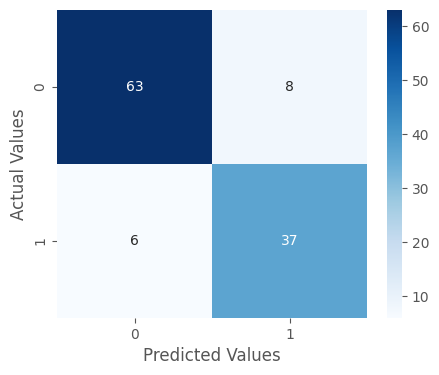

              precision    recall  f1-score   support

           0       0.91      0.89      0.90        71
           1       0.82      0.86      0.84        43

    accuracy                           0.88       114
   macro avg       0.87      0.87      0.87       114
weighted avg       0.88      0.88      0.88       114



In [74]:
DT_cm = metrics.confusion_matrix(y_test, DT_y_pred)
sns.heatmap(DT_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, DT_y_pred ))

4. K-nearest Neighbors (KNN)

In [75]:
KNN = KNeighborsClassifier()
KNN.fit(X_train, y_train)
KNN_y_pred = KNN.predict(X_test)

In [76]:
KNN_acc = accuracy_score(y_test, KNN_y_pred)
print("K-nearest Neighbors Accuracy: ",KNN_acc)

K-nearest Neighbors Accuracy:  0.9385964912280702


In [77]:
# K-nearest Neighbors Metrics
KNN_precision_score = precision_score(y_test, KNN_y_pred)
KNN_recall_score = recall_score(y_test, KNN_y_pred)
fp4, tp4, t4 = roc_curve(y_test, KNN_y_pred)
KNN_auc = auc(fp4, tp4)

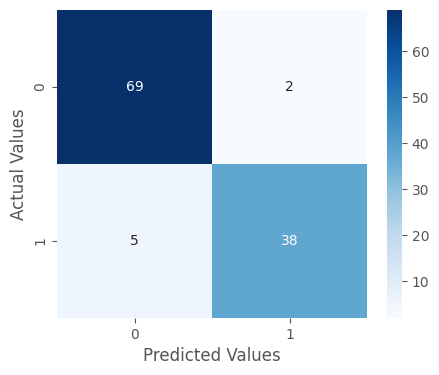

              precision    recall  f1-score   support

           0       0.93      0.97      0.95        71
           1       0.95      0.88      0.92        43

    accuracy                           0.94       114
   macro avg       0.94      0.93      0.93       114
weighted avg       0.94      0.94      0.94       114



In [78]:
KNN_cm = metrics.confusion_matrix(y_test, KNN_y_pred)
sns.heatmap(KNN_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, KNN_y_pred ))

5. Support Vector Machine (SVM)

In [79]:
svm = SVC()
svm_parameters = {
    'gamma' : [0.0001, 0.001, 0.01, 0.1],
    'C' : [0.01, 0.05, 0.5, 0.1, 1, 10, 15, 20]
}

grid_search_svm = GridSearchCV(svm, svm_parameters)
grid_search_svm.fit(X_train, y_train)
SVM_y_pred = grid_search_svm.predict(X_test)

In [80]:
SVM_acc = accuracy_score(y_test, SVM_y_pred)
print("Support Vector Machine Accuracy: ",SVM_acc)

Support Vector Machine Accuracy:  0.9473684210526315


In [81]:
# Logistic Regression Metrics
SVM_precision_score = precision_score(y_test, SVM_y_pred)
SVM_recall_score = recall_score(y_test, SVM_y_pred)
fp5, tp5, t5 = roc_curve(y_test, SVM_y_pred)
SVM_auc = auc(fp5, tp5)

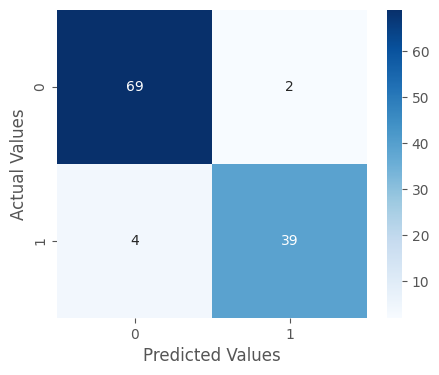

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        71
           1       0.95      0.91      0.93        43

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



In [82]:
SVM_cm = metrics.confusion_matrix(y_test, SVM_y_pred)
sns.heatmap(SVM_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, SVM_y_pred ))

6. Naive Bayes (NB)

In [111]:
params_NB = {'var_smoothing': np.logspace(0, -9, num=100)}

gs_NB = GridSearchCV(estimator=GaussianNB(), param_grid=params_NB, cv=5, verbose=1, scoring='accuracy')

gs_NB.fit(X_train, y_train)
gs_NB.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'var_smoothing': 0.15199110829529336}

In [112]:
NB = GaussianNB(var_smoothing= 0.15199110829529336)
NB.fit(X_train, y_train)
NB_y_pred = NB.predict(X_test)

In [113]:
nb_acc= NB.score(X_test,y_test)
print("Naive Bayes Accuracy: ",nb_acc)

Naive Bayes Accuracy:  0.9035087719298246


In [114]:
# Naive Bayes Metrics
NB_precision_score = precision_score(y_test, NB_y_pred)
NB_recall_score = recall_score(y_test, NB_y_pred)
fp6, tp6, t6 = roc_curve(y_test, NB_y_pred)
NB_auc = auc(fp6, tp6)

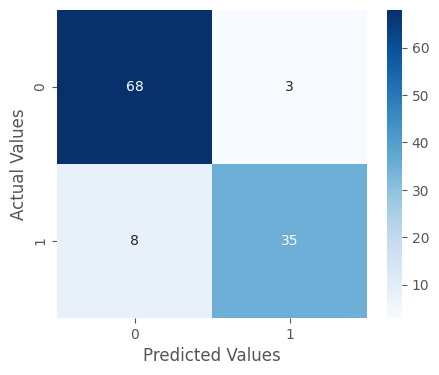

              precision    recall  f1-score   support

           0       0.89      0.96      0.93        71
           1       0.92      0.81      0.86        43

    accuracy                           0.90       114
   macro avg       0.91      0.89      0.89       114
weighted avg       0.90      0.90      0.90       114



In [116]:
NB_cm = metrics.confusion_matrix(y_test, NB_y_pred)
sns.heatmap(NB_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, NB_y_pred))

8. XGBoost

In [83]:
xgb = XGBClassifier(objective = 'binary:logistic', learning_rate = 0.5, max_depth = 5, n_estimators = 180)
xgb.fit(X_train, y_train)
xgb_y_pred = xgb.predict(X_test)

In [84]:
xgb_acc = accuracy_score(y_test, xgb_y_pred)
print("XGBoost Accuracy: ",xgb_acc)

XGBoost Accuracy:  0.9473684210526315


In [85]:
# XGBoost Metrics
xgb_precision_score = precision_score(y_test, xgb_y_pred)
xgb_recall_score = recall_score(y_test, xgb_y_pred)
fp8, tp8, t8 = roc_curve(y_test, xgb_y_pred)
xgb_auc = auc(fp8, tp8)

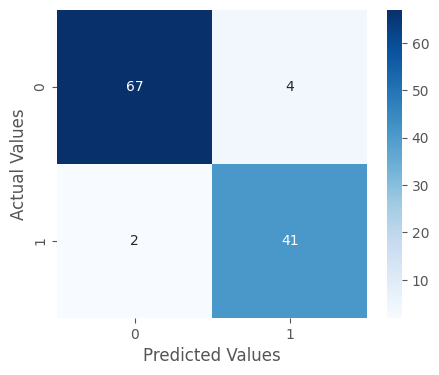

              precision    recall  f1-score   support

           0       0.97      0.94      0.96        71
           1       0.91      0.95      0.93        43

    accuracy                           0.95       114
   macro avg       0.94      0.95      0.94       114
weighted avg       0.95      0.95      0.95       114



In [86]:
xgb_cm = metrics.confusion_matrix(y_test, xgb_y_pred)
sns.heatmap(xgb_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, xgb_y_pred ))

9. Artificial Neural Network (ANN)

In [87]:
ANN = Sequential()
# the first hidden layer
ANN.add(Dense(units = 6, kernel_initializer = 'uniform', activation = 'relu', input_dim = 13))
ANN.add(Dropout(rate = 0.1))

# the second hidden layer
ANN.add(Dense(units = 6, kernel_initializer = 'uniform', activation = 'relu'))
ANN.add(Dropout(rate = 0.1))

# the output layer
ANN.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))
# compiling
ANN.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
ANN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 84        
                                                                 
 dropout (Dropout)           (None, 6)                 0         
                                                                 
 dense_1 (Dense)             (None, 6)                 42        
                                                                 
 dropout_1 (Dropout)         (None, 6)                 0         
                                                                 
 dense_2 (Dense)             (None, 1)                 7         
                                                                 
Total params: 133
Trainable params: 133
Non-trainable params: 0
_________________________________________________________________


In [88]:
# fitting the ANN to the Training set
ANN.fit(X_train, y_train, batch_size = 10, epochs = 100,verbose = 0)

# Predicting the Test set results
ANN_y_pred = ANN.predict(X_test)
ANN_y_pred = (ANN_y_pred > 0.5)

loss, ANN_acc = ANN.evaluate(X_test, y_test,batch_size=10)
print('Loss:', loss)
print('ANN accuracy:', ANN_acc)


12/12 [==============================] - 0s 701us/step - loss: 0.1667 - accuracy: 0.9561
Loss: 0.16665436327457428
ANN accuracy: 0.9561403393745422


In [89]:
# ANN Metrics
ANN_precision_score = precision_score(y_test, ANN_y_pred)
ANN_recall_score = recall_score(y_test, ANN_y_pred)
fp9, tp9, t9 = roc_curve(y_test, ANN_y_pred)
ANN_auc = auc(fp9, tp9)

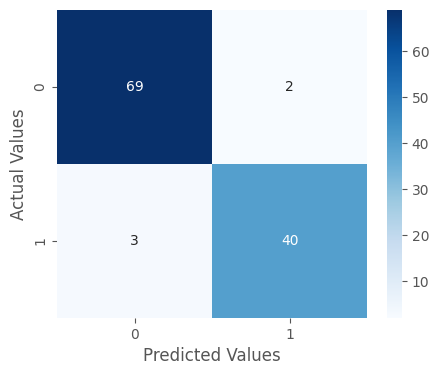

              precision    recall  f1-score   support

           0       0.96      0.97      0.97        71
           1       0.95      0.93      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



In [90]:
ANN_cm = confusion_matrix(y_test, ANN_y_pred)
sns.heatmap(ANN_cm, annot=True,fmt="d",cmap=plt.cm.Blues)
plt.rcParams["figure.figsize"]=(5,4)
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print(classification_report(y_test, ANN_y_pred ))

Classifiers Comparison

In [121]:
names = ['Logistic Regression', 'Random Forest','Decision Tree', 'KNN', 'SVM','NB', 'XGBoost', 'ANN']
Accuracy = [log_reg_acc, RF_acc, DT_acc, KNN_acc, SVM_acc,nb_acc, xgb_acc, ANN_acc]
precision = [LG_precision_score, RF_precision_score, DT_precision_score, KNN_precision_score, SVM_precision_score,NB_precision_score, xgb_precision_score, ANN_precision_score]
recall = [LG_recall_score, RF_recall_score, DT_recall_score, KNN_recall_score, SVM_recall_score,NB_recall_score, xgb_recall_score, ANN_recall_score]
auc = [LG_auc, RF_auc, DT_auc, KNN_auc, SVM_auc,NB_auc, xgb_auc, ANN_auc]

dict = {'Classifier': names, 'Accuracy': Accuracy,'Precision': precision, 'Recall': recall, 'AUC': auc}
MLA = pd.DataFrame(dict)
MLA.sort_values(by=['Accuracy'], ascending=False, inplace=True)
MLA

,Classifier,Accuracy,Precision,Recall,AUC
0,Logistic Regression,0.956140,0.952381,0.930233,0.951032
7,ANN,0.956140,0.952381,0.930233,0.951032
4,SVM,0.947368,0.951220,0.906977,0.939404
6,XGBoost,0.947368,0.911111,0.953488,0.948575
3,KNN,0.938596,0.950000,0.883721,0.927776
1,Random Forest,0.929825,0.906977,0.906977,0.925319
5,NB,0.903509,0.921053,0.813953,0.885850
2,Decision Tree,0.877193,0.822222,0.860465,0.873895


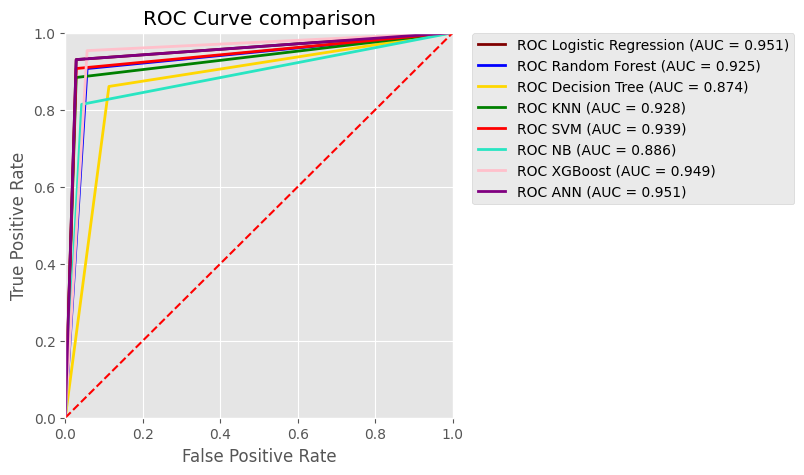

In [120]:
names=['Logistic Regression','Random Forest','Decision Tree','KNN','SVM','NB','XGBoost','ANN']
FP =[fp1,fp2,fp3,fp4,fp5,fp6,fp8,fp9]
TP=[tp1,tp2,tp3,tp4,tp5,tp6,tp8,tp9]
AUC=[LG_auc,RF_auc,DT_auc,KNN_auc,SVM_auc,NB_auc,xgb_auc,ANN_auc]

colors=['maroon','blue',"gold","green","red","#28E5C2","pink","purple"]

i=0
for i in range (0,8):
    plt.plot(FP[i], TP[i], lw=2,color=colors[i],label='ROC %s (AUC = %0.3f)'  % (names[i], AUC[i]))
    i+=1
    
plt.title('ROC Curve comparison')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')   
plt.rcParams["figure.figsize"]=(5,5)
plt.show()